## General Description
The work sample is from the NYC City Bike dataset in Google BigQuery. You can access the data from this link: https://console.cloud.google.com/marketplace/details/city-of-new-york/nyc-citi-bike

I'm answering questions below: <br/>
(which include SQL code to draw data structure from the Google BigQuery, and Python code to impletment statistical analysis and visulize results.)
* What is the trip duration distribution of Citibike trips?
* What is the most popular Citibike trip? 
* Were there new bike stations introduced or removed at any point in time? What makes you think it were or weren't?

In [4]:
from __future__ import print_function
import pandas as pd
import numpy as np

## Input parameters

In [5]:
project_id = "speedy-precept-268512"
process_date = "2020-02-23"
process_date_nodash = "20200223"

## Question 1
### What is the trip duration distribution of Citibike trips?
### Ans: 
Lognormal distribution.<br/>
The parameter of the lognormal distribution is 0.7740207642832148, 20.943962974413324, and 614.3445916251605

In [4]:
query = """
SELECT
  tripduration,
  starttime,
  stoptime
FROM 
  `bigquery-public-data.new_york.citibike_trips`
ORDER BY
  tripduration DESC
""".format(process_date_nodash)

print (query)

dta = pd.read_gbq(query, project_id=project_id, dialect='standard')
dta.head(20)


SELECT
  tripduration,
  starttime,
  stoptime
FROM 
  `bigquery-public-data.new_york.citibike_trips`
ORDER BY
  tripduration DESC



Downloading: 100%|██████████| 33319019/33319019 [36:33<00:00, 15188.61rows/s]


,tripduration,starttime,stoptime
0,6707533,2016-07-13 18:23:26+00:00,2016-09-29 09:35:40+00:00
1,6250750,2013-07-08 16:51:40+00:00,2013-09-19 01:10:53+00:00
2,6177145,2016-07-01 16:22:22+00:00,2016-09-11 04:14:48+00:00
3,6053789,2016-07-24 18:10:53+00:00,2016-10-02 19:47:23+00:00
4,5864661,2015-04-02 19:07:29+00:00,2015-06-09 16:11:50+00:00
5,5700729,2016-07-10 22:14:53+00:00,2016-09-14 21:47:02+00:00
6,5416640,2014-10-20 17:10:45+00:00,2014-12-22 08:48:04+00:00
7,5174309,2015-07-02 16:47:37+00:00,2015-08-31 14:06:07+00:00
8,4504481,2016-07-08 11:15:21+00:00,2016-08-29 14:30:03+00:00
9,4496060,2014-10-31 10:38:54+00:00,2014-12-22 10:33:09+00:00


In [1]:
import pandas as pd
dta = pd.read_csv(r"C:\\Users\\steve\\Documents\\Python\\ctbike.csv")
trip_d = dta.iloc[:,0]

The parameters of the fitted lognorm distribution is (0.7740207642832148, 20.943962974413324, 614.3445916251605), and the p-value of the KS test is 0.0.
The parameters of the fitted expon distribution is (60.0, 873.7485653764296), and the p-value of the KS test is 0.0.


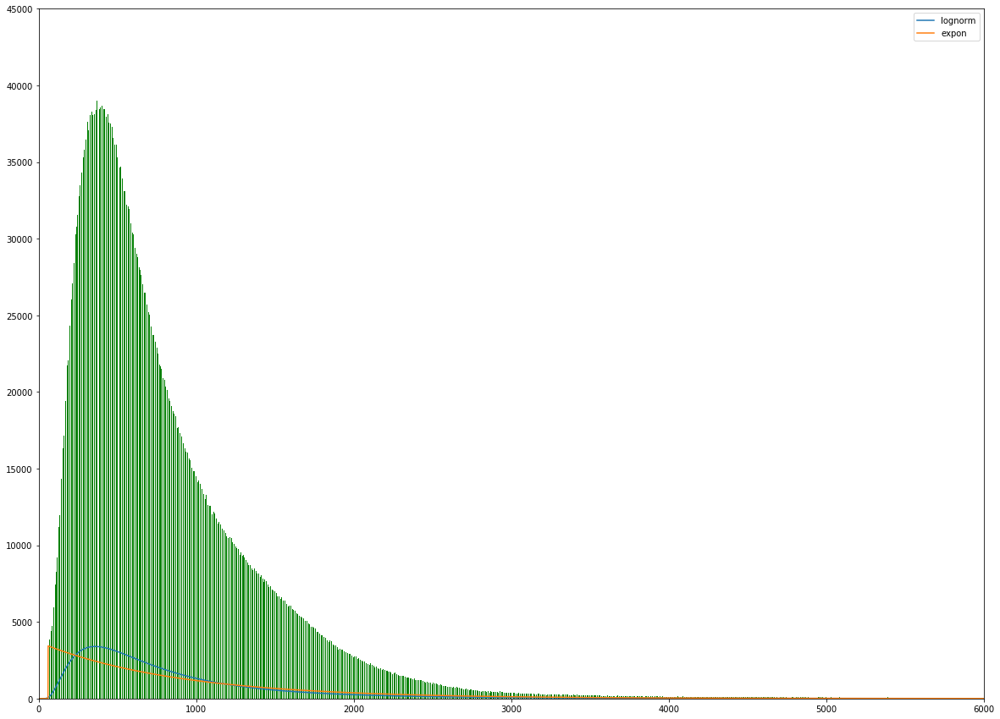

In [5]:
import matplotlib.pyplot as plt
import scipy
import scipy.stats as st

plt.figure(figsize=(20,15))

size = 6000
x = np.arange(size)
plt.hist(trip_d, bins=10000, edgecolor = 'black', range=(-1,6000), color = "yellow", lw=0)

dist_names = ['lognorm', 'expon']

for dist_name in dist_names:
    dist = getattr(scipy.stats, dist_name)
    param = dist.fit(trip_d)
    
    # Applying the Kolmogorov-Smirnov test
    D, p = st.kstest(trip_d, dist_name, args=param)
    print("The parameters of the fitted {d} distribution is {s}, and the p-value of the KS test is {p}.".format(d=dist_name, s=param, p=p))
    
    # Plot the cdf
    pdf_fitted = dist.pdf(x, *param[:-2], loc=param[-2], scale=param[-1]) * size
    plt.plot(pdf_fitted, label=dist_name)
    plt.xlim(0,6000)
    plt.ylim(0,45000)
    
plt.legend(loc='upper right')
plt.show()

The parameters of the fitted gamma distribution is (4.01544484108063e-05, 59.99999999999999, 1.5507267830985443).
The parameters of the fitted lognorm distribution is (0.7740207642832148, 20.943962974413324, 614.3445916251605).
The parameters of the fitted expon distribution is (60.0, 873.7485653764296).


C:\Users\steve\AppData\Roaming\Python\Python37\site-packages\scipy\optimize\minpack.py:162: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


The parameters of the fitted beta distribution is (2411.3949768839984, 48377.67259868127, -123636.98840104113, 2623553.901687026).


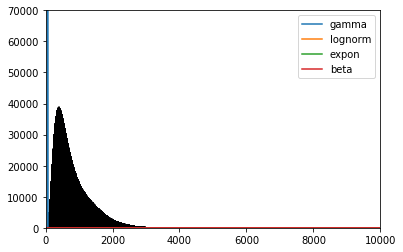

In [10]:
import matplotlib.pyplot as plt
import scipy
import scipy.stats
size = 30000
x = np.arange(size)
plt.hist(trip_d, bins=10000, color = 'blue', edgecolor = 'black', range=(-1,10000))

dist_names = ['gamma', 'lognorm', 'expon', 'beta']

for dist_name in dist_names:
    dist = getattr(scipy.stats, dist_name)
    param = dist.fit(trip_d)

    pdf_fitted = dist.pdf(x, *param[:-2], loc=param[-2], scale=param[-1]) * size
    plt.plot(pdf_fitted, label=dist_name)
    plt.xlim(0,10000)
    plt.ylim(0,70000)
    print("The parameters of the fitted {d} distribution is {s}.".format(d=dist_name, s=param))

plt.legend(loc='upper right')
plt.show()

In [26]:
import scipy.stats as st
def get_best_distribution(data):
    dist_names = ["expon", "lognorm"]
    dist_results = []
    params = {}
    for dist_name in dist_names:
        dist = getattr(st, dist_name)
        param = dist.fit(data)

        params[dist_name] = param
        # Applying the Kolmogorov-Smirnov test
        D, p = st.kstest(data, dist_name, args=param)
        print("p value for "+dist_name+" = "+str(p))
        dist_results.append((dist_name, p))

    # select the best fitted distribution
    best_dist, best_p = (max(dist_results, key=lambda item: item[1]))
    # store the name of the best fit and its p value

    print("Best fitting distribution: "+str(best_dist))
    print("Best p value: "+ str(best_p))
    print("Parameters for the best fit: "+ str(params[best_dist]))

    return best_dist, best_p, params[best_dist]

In [27]:
get_best_distribution(trip_d)

p value for norm = 0.0
p value for expon = 0.0
p value for lognorm = 0.0
Best fitting distribution: norm
Best p value: 0.0
Parameters for the best fit: (933.7485653764296, 7129.317770982459)


('norm', 0.0, (933.7485653764296, 7129.317770982459))

In [49]:
print('The average trip duration is '+ str(trip_d.mean()) + ' seconds.')
print('The standard deviation of trip duration is '+ str(trip_d.std())+ ' seconds.')

The average trip duration is 933.7485653764296 seconds.
The standard deviation of trip duration is 7129.317877962775 seconds.


## Question 2
###  What is the most popular Citibike trip? 
### Ans: 
According to the data, the highest numbers of trip is from "Central Park S & 6 Ave" to "Central Park S & 6 Ave", which is 47215 times. **However**, it seems the highest four numbers of trip are **not** "trip" at all, since they rent and returned at the same stop. It might be the testing sets which was recorded in this data.<br/>

If we look at the highest number of trip which rent and returned at different station, it is from **"12 Ave & W 40 St"** to **"West St & Chambers St"**, which was recorded **12417 times** of renting.

In [8]:
query = """
SELECT
  CONCAT(start_station_name, " to ", end_station_name) as route, 
  COUNT(*) as num_trips,
  ROUND(AVG(cast(tripduration as int64) / 60),2) as duration
FROM 
  `bigquery-public-data.new_york.citibike_trips`
GROUP BY
  start_station_name, end_station_name
ORDER BY 
  num_trips DESC
""".format(process_date_nodash)

print (query)

df2 = pd.read_gbq(query, project_id=project_id, dialect='standard')
df2.head(20)


SELECT
  CONCAT(start_station_name, " to ", end_station_name) as route, 
  COUNT(*) as num_trips,
  ROUND(AVG(cast(tripduration as int64) / 60),2) as duration
FROM 
  `bigquery-public-data.new_york.citibike_trips`
GROUP BY
  start_station_name, end_station_name
ORDER BY 
  num_trips DESC

Please visit this URL to authorize this application: https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=725825577420-unm2gnkiprugilg743tkbig250f4sfsj.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fbigquery&state=RhlcPebsSvIb3bhgZs2pFkdzxQ2MGQ&prompt=consent&access_type=offline
Enter the authorization code: 4/wwH-LBVJAFhCxQXyHOYoRQs2YJCKRlM7XHPQdRqI7amNONWREjUS0G0


Downloading: 100%|██████████| 251772/251772 [00:15<00:00, 15323.28rows/s]


,route,num_trips,duration
0,Central Park S & 6 Ave to Central Park S & 6 Ave,47215,48.00
1,Grand Army Plaza & Central Park S to Grand Arm...,18292,48.69
2,Broadway & W 60 St to Broadway & W 60 St,16626,45.76
3,Centre St & Chambers St to Centre St & Chamber...,13979,33.72
4,12 Ave & W 40 St to West St & Chambers St,12417,24.62
5,W 21 St & 6 Ave to 9 Ave & W 22 St,11778,5.45
6,W 21 St & 6 Ave to W 22 St & 10 Ave,10751,7.03
7,West St & Chambers St to West St & Chambers St,10672,26.11
8,West Thames St to Vesey Pl & River Terrace,10002,7.67
9,E 7 St & Avenue A to Lafayette St & E 8 St,9888,5.69


## Question 3
### Were there new bike stations introduced or removed at any point in time? What makes you think it were or weren't?

## Step 1
Transform data from original form to new form, which set station as rows and date as columns.

In [6]:
query = """
SELECT
  DISTINCT CAST(DATE(starttime) AS DATE) AS starttime,
  start_station_name,
  COUNT(*) as num_trips
FROM 
  `bigquery-public-data.new_york.citibike_trips`
GROUP BY
  1,
  2
ORDER BY 
  starttime
""".format(process_date_nodash)

print (query)

df3 = pd.read_gbq(query, project_id=project_id, dialect='standard')



SELECT
  DISTINCT CAST(DATE(starttime) AS DATE) AS starttime,
  start_station_name,
  COUNT(*) as num_trips
FROM 
  `bigquery-public-data.new_york.citibike_trips`
GROUP BY
  1,
  2
ORDER BY 
  starttime



Downloading: 100%|██████████| 442779/442779 [00:28<00:00, 15358.76rows/s]


,starttime,start_station_name,num_trips
0,2013-07-01,10 Ave & W 28 St,51
1,2013-07-01,6 Ave & Canal St,50
2,2013-07-01,Fulton St & Waverly Ave,17
3,2013-07-01,Monroe St & Bedford Ave,5
4,2013-07-01,Sullivan St & Washington Sq,44
5,2013-07-01,Gallatin Pl & Livingston St,7
6,2013-07-01,Franklin Ave & Myrtle Ave,1
7,2013-07-01,E 13 St & Avenue A,58
8,2013-07-01,W 59 St & 10 Ave,76
9,2013-07-01,Division St & Bowery,31


In [22]:
# get all the date
dt = list(set(list(df3.iloc[:,0])))
dt = sorted(dt)
dt

['2013-07-01',
 '2013-07-02',
 '2013-07-03',
 '2013-07-04',
 '2013-07-05',
 '2013-07-06',
 '2013-07-07',
 '2013-07-08',
 '2013-07-09',
 '2013-07-10',
 '2013-07-11',
 '2013-07-12',
 '2013-07-13',
 '2013-07-14',
 '2013-07-15',
 '2013-07-16',
 '2013-07-17',
 '2013-07-18',
 '2013-07-19',
 '2013-07-20',
 '2013-07-21',
 '2013-07-22',
 '2013-07-23',
 '2013-07-24',
 '2013-07-25',
 '2013-07-26',
 '2013-07-27',
 '2013-07-28',
 '2013-07-29',
 '2013-07-30',
 '2013-07-31',
 '2013-08-01',
 '2013-08-02',
 '2013-08-03',
 '2013-08-04',
 '2013-08-05',
 '2013-08-06',
 '2013-08-07',
 '2013-08-08',
 '2013-08-09',
 '2013-08-10',
 '2013-08-11',
 '2013-08-12',
 '2013-08-13',
 '2013-08-14',
 '2013-08-15',
 '2013-08-16',
 '2013-08-17',
 '2013-08-18',
 '2013-08-19',
 '2013-08-20',
 '2013-08-21',
 '2013-08-22',
 '2013-08-23',
 '2013-08-24',
 '2013-08-25',
 '2013-08-26',
 '2013-08-27',
 '2013-08-28',
 '2013-08-29',
 '2013-08-30',
 '2013-08-31',
 '2013-09-01',
 '2013-09-02',
 '2013-09-03',
 '2013-09-04',
 '2013-09-

In [23]:
# get all the station name
station_name = df3.iloc[:,1]
station_name = sorted(list(set(station_name)))
station_name

['1 Ave & E 15 St',
 '1 Ave & E 16 St',
 '1 Ave & E 18 St',
 '1 Ave & E 30 St',
 '1 Ave & E 44 St',
 '1 Ave & E 62 St',
 '1 Ave & E 68 St',
 '1 Ave & E 78 St',
 '1 Ave & E 94 St',
 '1 Pl & Clinton St',
 '10 Ave & W 28 St',
 '10 St & 5 Ave',
 '10 St & 7 Ave',
 '11 Ave & W 27 St',
 '11 Ave & W 41 St',
 '11 Ave & W 59 St',
 '12 Ave & W 40 St',
 '12 St & 4 Ave',
 '14 St & 5 Ave',
 '14 St & 7 Ave',
 '2 Ave  & E 104 St',
 '2 Ave & 9 St',
 '2 Ave & E 105 St',
 '2 Ave & E 31 St',
 '2 Ave & E 58 St',
 '2 Ave & E 99 St',
 '21 St & 41 Ave',
 '21 St & 43 Ave',
 '21 St & Queens Plaza North',
 '3 Ave & 14 St',
 '3 Ave & E 100 St',
 '3 Ave & E 62 St',
 '3 Ave & E 71 St',
 '3 Ave & E 72 St',
 '3 Ave & Schermerhorn St',
 '3 St & 3 Ave',
 '3 St & 7 Ave',
 '3 St & Hoyt St',
 '3 St & Prospect Park West',
 '31 St & Thomson Ave',
 '3969.TEMP (Bike The Branches - Central Branch)',
 '4 Ave & 9 St',
 '44 Dr & Jackson Ave',
 '45 Rd & 11 St',
 '46 Ave & 5 St',
 '47 Ave & 31 St',
 '48 Ave & 5 St',
 '5 Ave & 3 St'

In [24]:
# Transform into another form of dataframe (using stations as columns)
# Create new dataframe and fill all the cells with 0
import pandas as pd
station_flow = pd.DataFrame(index=dt, columns=station_name)
station_flow = station_flow.fillna(0) # with 0s rather than NaNs
station_flow

,1 Ave & E 15 St,1 Ave & E 16 St,1 Ave & E 18 St,1 Ave & E 30 St,1 Ave & E 44 St,1 Ave & E 62 St,1 Ave & E 68 St,1 Ave & E 78 St,1 Ave & E 94 St,1 Pl & Clinton St,...,William St & Pine St,Willoughby Ave & Hall St,Willoughby Ave & Tompkins Ave,Willoughby Ave & Walworth St,Willoughby St & Fleet St,Wolcott St & Dwight St,Wyckoff St & 3 Ave,Wythe Ave & Metropolitan Ave,Yankee Ferry Terminal,York St & Jay St
2013-07-01,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2013-07-02,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2013-07-03,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2013-07-04,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2013-07-05,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-26,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2016-09-27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2016-09-28,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2016-09-29,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [25]:
# Set 'starttime' column as index of the old dataframe in order to get certain cell with 'starttime' (e.g. 2016-09-30)
df3=df3.set_index('starttime')

In [29]:
# Store the value in old dataframe to the new dataframe
for name in station_name:
    for date in list(station_flow.index):
        if any(df3.loc[date,'start_station_name']==name):
            station_flow.iloc[:,station_flow.columns.get_loc(name)][date]=df3.iloc[np.where(df3.loc[date,'start_station_name']==name)[0][0],1]
        else:
            station_flow.iloc[:,station_flow.columns.get_loc(name)][date]=0
station_flow

,1 Ave & E 15 St,1 Ave & E 16 St,1 Ave & E 18 St,1 Ave & E 30 St,1 Ave & E 44 St,1 Ave & E 62 St,1 Ave & E 68 St,1 Ave & E 78 St,1 Ave & E 94 St,1 Pl & Clinton St,...,William St & Pine St,Willoughby Ave & Hall St,Willoughby Ave & Tompkins Ave,Willoughby Ave & Walworth St,Willoughby St & Fleet St,Wolcott St & Dwight St,Wyckoff St & 3 Ave,Wythe Ave & Metropolitan Ave,Yankee Ferry Terminal,York St & Jay St
2013-07-01,74,0,51,66,56,0,0,0,0,0,...,57,19,0,8,21,0,0,23,0,46
2013-07-02,69,0,81,50,18,0,0,0,0,0,...,118,56,0,62,62,0,0,96,0,47
2013-07-03,8,0,29,83,31,0,0,0,0,0,...,36,42,0,50,40,0,0,42,0,83
2013-07-04,66,0,68,50,35,0,0,0,0,0,...,76,35,0,44,22,0,0,81,0,57
2013-07-05,97,0,17,107,85,0,0,0,0,0,...,77,2,0,82,22,0,0,13,0,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-26,0,0,0,76,130,86,44,28,62,2,...,5,43,14,21,85,79,7,42,0,2
2016-09-27,0,0,0,86,135,62,56,44,37,64,...,67,6,28,95,25,76,28,42,0,8
2016-09-28,0,0,0,118,32,56,28,8,7,27,...,31,66,48,20,42,69,12,63,0,46
2016-09-29,0,0,0,8,108,56,57,50,86,95,...,83,6,80,78,51,94,101,42,0,51


In [2]:
station_flow.loc['Avg'] = [int(i) for i in round(station_flow.mean(axis=0))]
station_flow

,1 Ave & E 15 St,1 Ave & E 16 St,1 Ave & E 18 St,1 Ave & E 30 St,1 Ave & E 44 St,1 Ave & E 62 St,1 Ave & E 68 St,1 Ave & E 78 St,1 Ave & E 94 St,1 Pl & Clinton St,...,William St & Pine St,Willoughby Ave & Hall St,Willoughby Ave & Tompkins Ave,Willoughby Ave & Walworth St,Willoughby St & Fleet St,Wolcott St & Dwight St,Wyckoff St & 3 Ave,Wythe Ave & Metropolitan Ave,Yankee Ferry Terminal,York St & Jay St
2013-07-01,74,0,51,66,56,0,0,0,0,0,...,57,19,0,8,21,0,0,23,0,46
2013-07-02,69,0,81,50,18,0,0,0,0,0,...,118,56,0,62,62,0,0,96,0,47
2013-07-03,8,0,29,83,31,0,0,0,0,0,...,36,42,0,50,40,0,0,42,0,83
2013-07-04,66,0,68,50,35,0,0,0,0,0,...,76,35,0,44,22,0,0,81,0,57
2013-07-05,97,0,17,107,85,0,0,0,0,0,...,77,2,0,82,22,0,0,13,0,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-27,0,0,0,86,135,62,56,44,37,64,...,67,6,28,95,25,76,28,42,0,8
2016-09-28,0,0,0,118,32,56,28,8,7,27,...,31,66,48,20,42,69,12,63,0,46
2016-09-29,0,0,0,8,108,56,57,50,86,95,...,83,6,80,78,51,94,101,42,0,51
2016-09-30,0,0,0,35,118,5,107,46,50,61,...,8,15,86,29,18,0,8,29,0,108


## Step 2
Visualize data to better understand the usage of each station given different dates.

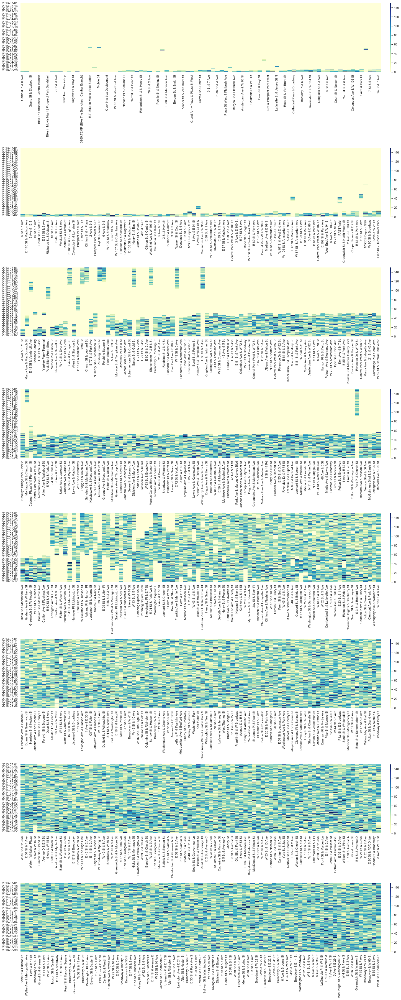

In [10]:
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

station_flow=station_flow.sort_values(by='Avg', axis=1, ascending=True) # sort the dataframe with the Average number of renting
f, axes = plt.subplots(nrows=8, figsize=(20,50),constrained_layout=True)
pt1 = sns.heatmap(station_flow.iloc[0:1185,0:85],cmap="YlGnBu",cbar=0.001, ax=axes[0], vmax=150)
pt1 = sns.heatmap(station_flow.iloc[0:1185,86:170],cmap="YlGnBu",cbar=0.001, ax=axes[1], vmax=150)
pt2 = sns.heatmap(station_flow.iloc[0:1185,171:255],cmap="YlGnBu",cbar=0.001, ax=axes[2], vmax=150)
pt2 = sns.heatmap(station_flow.iloc[0:1185,256:340],cmap="YlGnBu",cbar=0.001, ax=axes[3], vmax=150)
pt3 = sns.heatmap(station_flow.iloc[0:1185,341:425],cmap="YlGnBu",cbar=0.001, ax=axes[4], vmax=150)
pt3 = sns.heatmap(station_flow.iloc[0:1185,426:510],cmap="YlGnBu",cbar=0.001, ax=axes[5], vmax=150)
pt4 = sns.heatmap(station_flow.iloc[0:1185,511:595],cmap="YlGnBu",cbar=0.001, ax=axes[6], vmax=150)
pt4 = sns.heatmap(station_flow.iloc[0:1185,596:680],cmap="YlGnBu",cbar=0.001, ax=axes[7], vmax=150)

According to the visualization results, we can know that:

1) Although some of the stations were removed more than 60 days, they were back to function before the last date of data 2016-09-30 and couldn't be categorized as stations removed. Therefore, we add one more criteria, which is **stations are not resume to service until 2016-09-30**, for the stations being removed.

2) Some of the stations were installed at some point between 2013-07-01 and 2016-09-30. However, they were removed quickly in a few days after their installation. We guess it might be just testing sets for the bike sharing company, and can't be included in the list of newly installed bike stations. Therefore, we add one more criteria, which is **newly installed stations last more than 30 days**, for the stations being installed.

## Step 3
Identify stations are removed or installed base on principles as below.
1. Cirteria for stations are identified as **removed**: (i) 60 days without bike renting and (ii) without bike renting until 2016-09-30
2. Cirteria for stations are identified as **newly installed**: (i) initially without bike renting (ii) exist more than 30 days


In [11]:
# determine the date when stations are removed with two criteria: (1) 60 days without bike renting and (2) without bike renting until 2016-09-30
from operator import itemgetter
from itertools import groupby
import numpy as np

station_name = list(station_flow.columns.values)
rm_station=dict()
temp=dict()
for name in station_name:
    i=0
    data = np.where(station_flow.loc[:,[name]]==0)[0]
    for k, g in groupby(enumerate(data), lambda ix : ix[0] - ix[1]):
        temp[i]=list(map(itemgetter(1), g))
        if len(temp[i])>60 and list(station_flow.index)[temp[i][-1]]=='2016-09-30':
            rm_station[name]=list(station_flow.index)[temp[i][0]] + ' to ' + list(station_flow.index)[temp[i][-1]]
        i=i+1

rm_station

{'E 67 St & Lexington Ave': '2015-09-25 to 2016-09-30',
 'KentAve&N7 St': '2016-03-26 to 2016-09-30',
 'Lafayette St & Jersey St N': '2016-07-20 to 2016-09-30',
 '21 St & Queens Plaza North': '2015-10-30 to 2016-09-30',
 '8 Ave & W 31 St N': '2016-05-18 to 2016-09-30',
 'E 40 St & Madison Ave': '2016-01-05 to 2016-09-30',
 'PABT Valet': '2016-03-01 to 2016-09-30',
 'E 82 St & 2 Ave': '2015-11-21 to 2016-09-30',
 'Center Blvd\xa0& Borden Ave': '2015-12-01 to 2016-09-30',
 'Marcy Ave & MacDonough St': '2016-04-05 to 2016-09-30',
 'E 42 St & Vanderbilt Ave': '2014-09-01 to 2016-09-30',
 'Peck Slip & Front Street': '2015-01-01 to 2016-09-30',
 '7 Ave & Farragut St': '2014-05-01 to 2016-09-30',
 'E 48 St & Madison Ave': '2015-10-10 to 2016-09-30',
 'State St': '2014-04-30 to 2016-09-30',
 'Church St & Leonard St': '2014-03-01 to 2016-09-30',
 'N Henry St & Richardson St': '2016-05-12 to 2016-09-30',
 'Pershing Square N': '2014-03-01 to 2016-09-30',
 'Pershing Square S': '2014-03-01 to 2016-

In [19]:
# determine the date when stations are installed with one criteria: (1) initially without bike renting (2) exist more than 30 days
from operator import itemgetter
from itertools import groupby
import numpy as np
from datetime import datetime
import time
import datetime

station_name = list(station_flow.columns.values)
inst_station=dict()
temp=dict()
for name in station_name:
    i=0
    data = np.where(station_flow.loc[:,[name]]==0)[0]
    for k, g in groupby(enumerate(data), lambda ix : ix[0] - ix[1]):
        temp[i]=list(map(itemgetter(1), g))
        if list(station_flow.index)[temp[i][0]]=='2013-07-01' and ((time.mktime(datetime.datetime.strptime(list(station_flow.index)[temp[i][-1]], "%Y-%m-%d").timetuple()) - time.mktime(datetime.datetime.strptime(list(station_flow.index)[temp[i][0]], "%Y-%m-%d").timetuple()))/(60*60*24) > 30):
            inst_station[name]=list(station_flow.index)[temp[i][-1]+1]  #install time
        i=i+1

inst_station

{'Garfield Pl & 8 Ave': '2016-09-22',
 'E 74 St & 1 Ave': '2016-09-21',
 'Grand St & Elizabeth St': '2016-09-30',
 'Adventures NYC': '2016-06-18',
 'Bike The Branches - Central Branch': '2016-05-07',
 'Bike The Branches - Red Hook Branch': '2016-05-07',
 'Bike in Movie Night | Prospect Park Bandshell': '2016-09-22',
 '8D OPS 01': '2016-07-12',
 '7 St & 3 Ave': '2016-09-23',
 'E 65 St & 2 Ave': '2016-09-29',
 'SSP Tech Workshop': '2016-07-18',
 'Madison Ave & E 82 St': '2016-09-29',
 'Degraw St & Hoyt St': '2016-09-30',
 '3 Ave & E 72 St': '2016-09-28',
 '3969.TEMP (Bike The Branches - Central Branch)': '2016-05-07',
 'Greenwich St & Hubert St': '2016-09-30',
 'E.T. Bike-In Movie Valet Station': '2015-08-01',
 'NYCBS Depot - FAR': '2016-07-04',
 'Mobile 01': '2015-08-01',
 '2 Ave & E 105 St': '2016-08-12',
 'Kiosk in a box Deployment': '2016-07-28',
 'Mercer St & Bleecker St S': '2016-06-22',
 'W 88 St & West End Ave': '2016-09-30',
 'Coffey St & Conover St': '2016-09-13',
 'Hanson Pl &

# Appendix: Draw Geomap
Since I would also like to know exact locations of stations and its popularity, I also draw a Geomap to better understand the relationship.

In [6]:
query = """
SELECT
  DISTINCT CAST(DATE(starttime) AS DATE) AS starttime,
  start_station_name,
  start_station_latitude,
  start_station_longitude,
  COUNT(*) as num_trips
FROM 
  `bigquery-public-data.new_york.citibike_trips`

GROUP BY
  1,
  2,
  3,
  4
ORDER BY 
  starttime 
""".format(process_date_nodash)

print (query)

df4 = pd.read_gbq(query, project_id=project_id, dialect='standard')


SELECT
  DISTINCT CAST(DATE(starttime) AS DATE) AS starttime,
  start_station_name,
  start_station_latitude,
  start_station_longitude,
  COUNT(*) as num_trips
FROM 
  `bigquery-public-data.new_york.citibike_trips`

GROUP BY
  1,
  2,
  3,
  4
ORDER BY 
  starttime 



Downloading: 100%|██████████| 442779/442779 [00:46<00:00, 9623.94rows/s]


In [7]:
df4.head()

,starttime,start_station_name,start_station_latitude,start_station_longitude,num_trips
0,2013-07-01,Fulton St & Clermont Ave,40.684157,-73.969223,8
1,2013-07-01,W 18 St & 6 Ave,40.739713,-73.994564,83
2,2013-07-01,W Broadway & Spring St,40.724910,-74.001547,86
3,2013-07-01,Broadway & W 49 St,40.760647,-73.984427,103
4,2013-07-01,Washington Ave & Greene Ave,40.686501,-73.965633,7


In [8]:
import folium
from folium.plugins import HeatMapWithTime

def generateBaseMap(default_location=[40.733943, -73.985880], default_zoom_start=12):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [9]:
base_map = generateBaseMap()
base_map

In [10]:
from folium.plugins import HeatMap
base_map = generateBaseMap()
HeatMap(data=df4.iloc[:,2:4].values.tolist(), radius=8, max_zoom=13).add_to(base_map)

In [11]:
base_map #since the folium maps do not seem to render on GitHub, I put the result map in the readme.

### Note: Since the folium maps do not seem to render on GitHub, I put the result map in the readme.